Elazar Fine

https://www.kaggle.com/elfein

The goal of this competition is to predict the sales price for residential homes in Ames, Iowa, based on 79 explanatory variables.

>(exercise 1)
>We will use ```Linear Regression``` as our model, aided by ```Cross Validation```, ```Regularization```, and ```Feature Selection```.

we will use ```knn```, ```svm```, ```decision trees``` with hyperparameter searches and ```Voting```, ```Stacking``` and ```Random Forest``` ensembles.

## Imports and Definitions

In [1]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn # suppress annoying warnings

# import numpy, matplotlib, etc.
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# sklearn imports
from sklearn import metrics
from sklearn import pipeline
from sklearn import linear_model
from sklearn import preprocessing
from sklearn import neural_network
from sklearn import model_selection
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split

# sweetviz
!pip install sweetviz
import sweetviz as sw

# tqdm
from tqdm.auto import tqdm

# # autoviz
# !pip install autoviz
# from autoviz.AutoViz_Class import AutoViz_Class

In [2]:
train_path = "train.csv"
test_path  = "test.csv"

## Data Investigation and Preprocessing

---

                                             |                                             | [  0%]   00:00 ->…


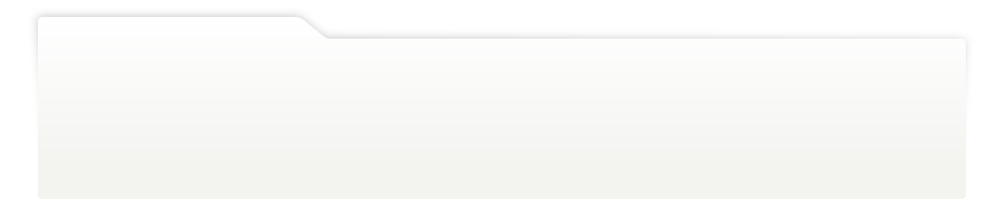
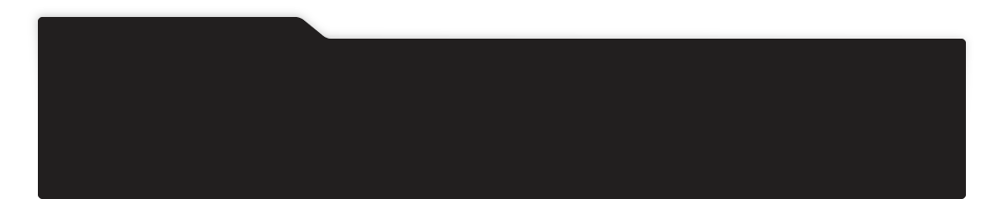
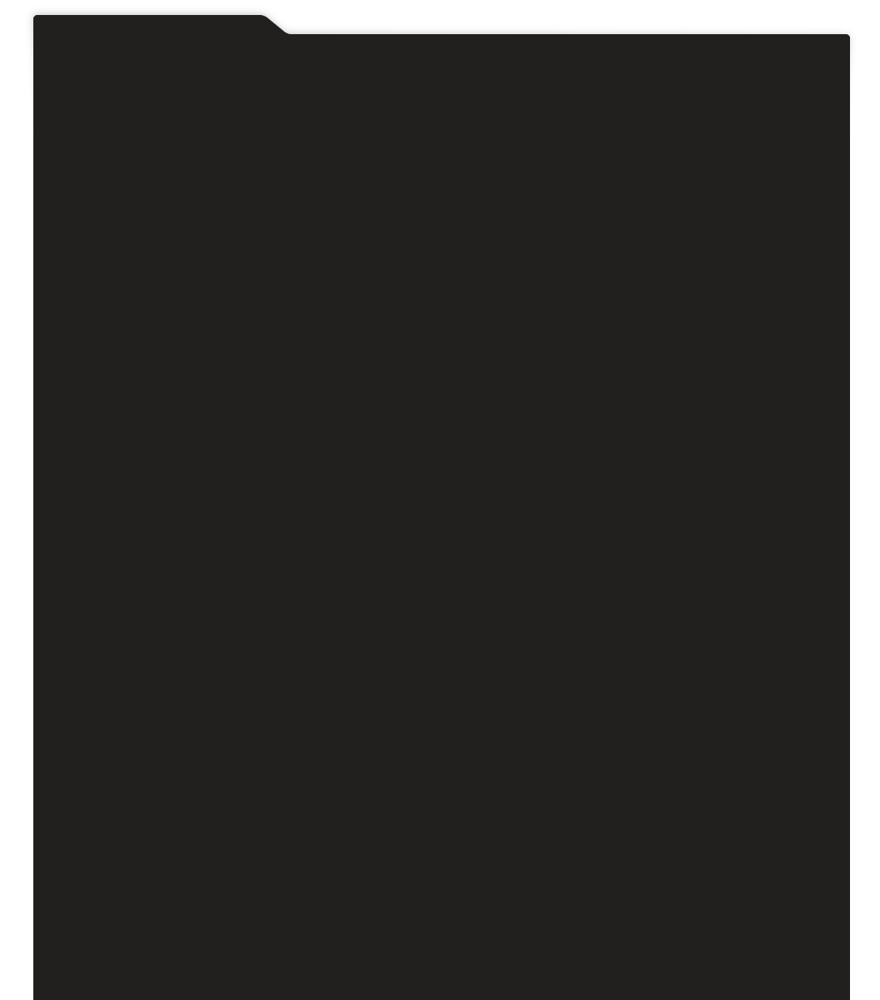
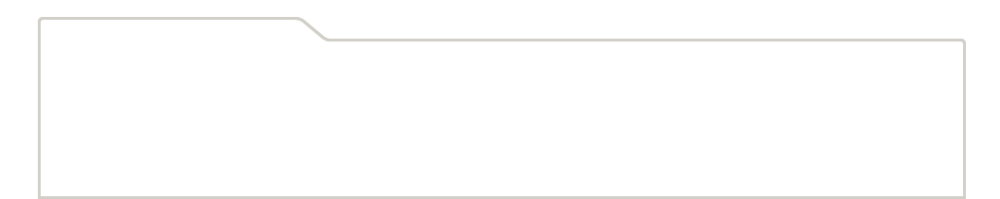
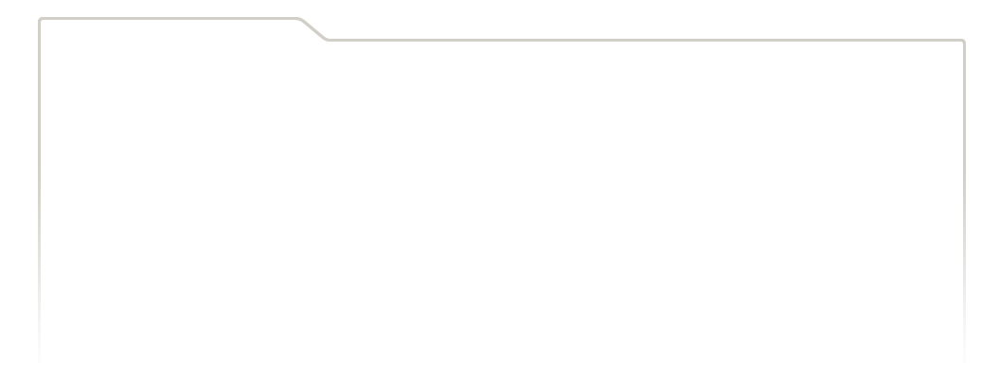
...
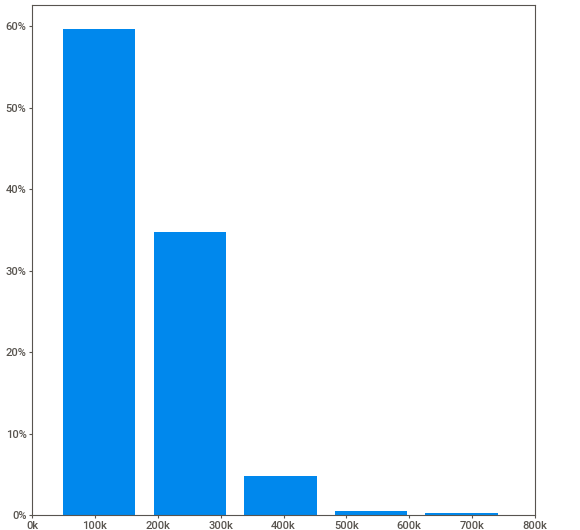
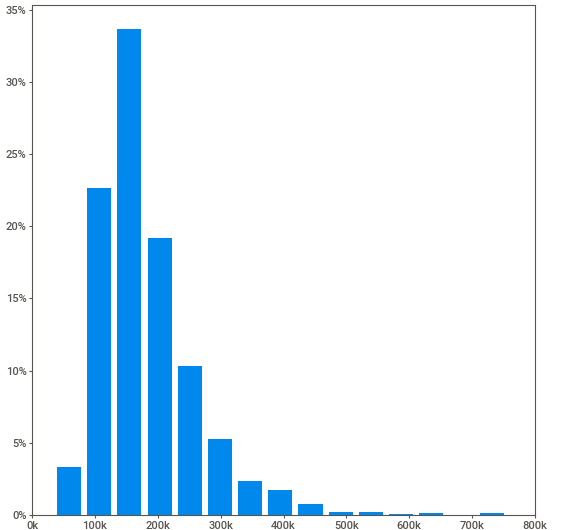
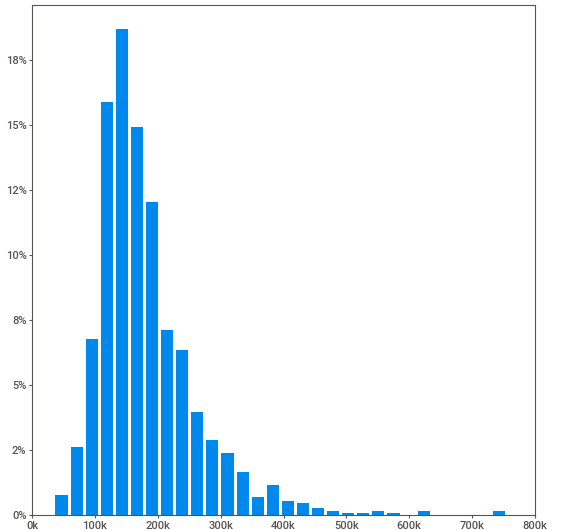
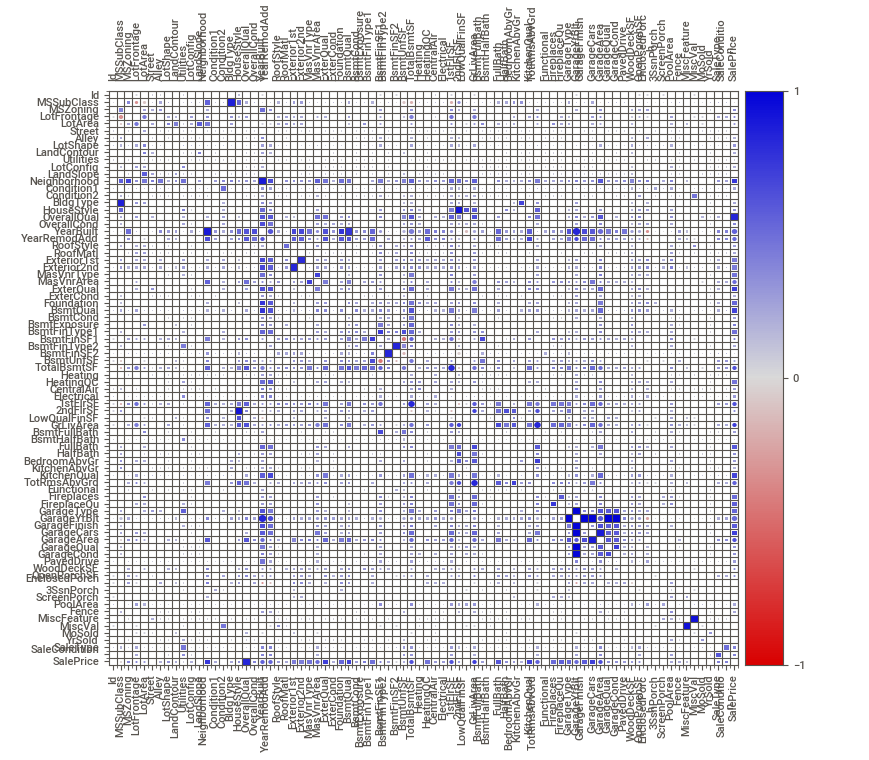
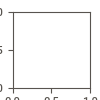

In [32]:
# load dataframes
train_df = pd.read_csv(train_path)
test_df  = pd.read_csv(test_path)

# save IDs for later
test_ids = test_df['Id']

show_visuals = True # disable for faster run of all cells

# analyze initial data before reprocessing
if show_visuals:
    houses_report = sw.analyze(train_df)
    houses_report.show_notebook(layout='vertical')

Looks like we have a lot of missing / useless data, before we can do a proper data analysis, we'll need to clean it up.

We will remove features that have too many missing similar values or that are irrelevant like IDs.

In [33]:
# function to drop a column from the df
def drop_col(df, col_name):
    df.drop([col_name], axis=1, inplace=True)

useless_features = ['Id', 'Street', 'Alley', 'Utilities', 'Condition2', 'RoofMatl', 'BsmtFinSF2', 'LowQualFinSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC', 'Fence', 'MiscFeature', 'MiscVal']
for feature in useless_features:
    drop_col(train_df, feature)
    drop_col(test_df, feature)

#### Now we fill all missing values:

In [34]:
# replace all the column's empty values with the column's mean value or a random one (50% chance for value around mean) 
# this is to avoid stack too many rows with the same exact value, but still being better than random.
def fill_na_random_or_mean(df, column_name):
    df_not_null = df[~df[column_name].isnull()]
    df_null = df[df[column_name].isnull()]
    mean = round(df_not_null[column_name].mean())
    std = round(df_not_null[column_name].std())
    df[column_name] = df[column_name].apply(
        lambda x: np.random.choice([
            mean,
            mean - std,
            mean + std,
            np.random.choice(df_not_null[column_name]),
            np.random.choice(df_not_null[column_name]),
            np.random.choice(df_not_null[column_name])
        ]) if pd.isnull(x) else x
    )
    
numeric_features_with_missing_vals = ['LotFrontage', 'MasVnrArea', 'GarageYrBlt']  

for feature in numeric_features_with_missing_vals:
    fill_na_random_or_mean(train_df, feature)
    fill_na_random_or_mean(test_df, feature)

#### Dealt with numerical columns, now to categorical:

In [35]:
def fill_na_random_pick_column_distribution(df, column_name):
    df_not_null = df[~df[column_name].isnull()]
    df_null = df[df[column_name].isnull()]
    options = np.random.choice(df_not_null[column_name])
    df[column_name] = df[column_name].apply(lambda x: np.random.choice(df_not_null[column_name]) if pd.isnull(x) else x)
    
for column_name in test_df.columns:
    fill_na_random_pick_column_distribution(train_df, column_name)
    fill_na_random_pick_column_distribution(test_df, column_name)

[
train_df.isnull().values.any(),
train_df.isna().values.any(),
test_df.isnull().values.any(),
test_df.isna().values.any()
]

[False, False, False, False]

# Data Analysis

looking again at the sweetviz report, we can see which features have the highest correlation with the target ```SalePrice```:

| Feature      | Correlation |
|--------------|-------------|
| OverallQual  | 0.83        |
| Neighborhood | 0.74        |
| GarageCars   | 0.70        |
| ExterQual    | 0.69        |
| BsmtQual     | 0.68        |
| KitchenQual  | 0.68        |
| FullBath     | 0.58        |
| GarageFinish | 0.55        |
| FireplaceQu  | 0.54        |
| Foundation   | 0.51        |
| GarageType   | 0.50        |
| Fireplaces   | 0.48        |
| BsmtFinType  | 0.46       |
| HeatingQC    | 0.44        |

There are some features which we can create hyper-features from, by logic.

For instance, we can take all the features which are related to ```area``` or ```SF``` (square feet) which have some correlation to ```SalePrice``` and combine them to a new feature called ```TotalArea```.
Let's do that.

In [36]:
def build_total_area(df):
    df['TotalArea'] = sum([df['1stFlrSF'], df.GrLivArea, df.TotalBsmtSF])

build_total_area(train_df)
build_total_area(test_df)

train_df['TotalArea'].corr(train_df['SalePrice'])

0.7577576804438045

success! our new hyper feature has a correlation of 0.758

# Feature Selection

#### select features using ```RFECV``` (I prefered it over ```RFE``` for using ```CV```)

In [37]:
t = train_df['SalePrice'].copy()
X = train_df.drop(['SalePrice'], axis=1)

# find best subset of features on this dataset
from sklearn.feature_selection import RFECV
from sklearn.model_selection import RepeatedKFold
# use column transformer to insert different transformers for each column
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import RFE

numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include=['object', 'bool']).columns
all_cols = list(categorical_cols) + list(numerical_cols)
ct_enc_std = ColumnTransformer([
            ("encoding", OrdinalEncoder(), categorical_cols),
            ("standard", StandardScaler(), numerical_cols)])
X_encoded = pd.DataFrame(ct_enc_std.fit_transform(X, t), columns=all_cols)

selector = RFECV(SGDRegressor(random_state=1)).fit(X_encoded, t)
X_selected = X_encoded.loc[:, selector.support_]

print("# of selected features:", len(X_selected.columns), " | Best Score:", max(selector.cv_results_['mean_test_score']))

# of selected features: 46  | Best Score: 0.7832840361205329


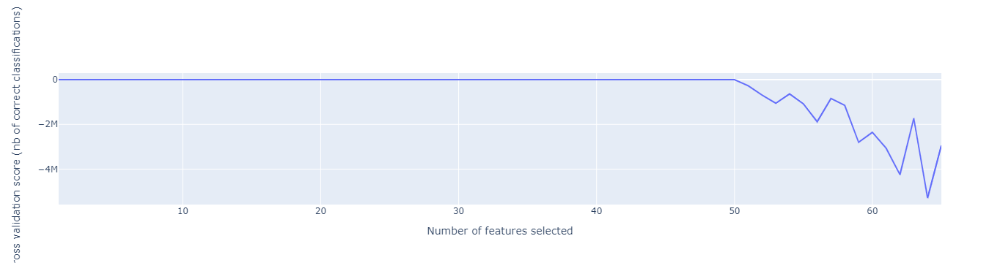

In [38]:
if show_visuals:
    fig = go.Figure()
    results = selector.cv_results_['mean_test_score'] # Getting the mean cv score for each set of features
    # results = selector.cv_results_['mean_test_score'] # outside of kaggle we use new version of sklearn
    fig.add_trace(go.Scatter(x=[i for i in range(1, len(results) + 1)], y=results))
    fig.update_xaxes(title_text="Number of features selected")
    fig.update_yaxes(title_text="Cross validation score (nb of correct classifications)")
    fig.show()

In [39]:
# update test_df accordingly
tst_column_names = X_selected.columns.values.tolist()
tst_selected = test_df[tst_column_names]

tst_numerical_cols = tst_selected.select_dtypes(include=['int64', 'float64']).columns
tst_categorical_cols = tst_selected.select_dtypes(include=['object', 'bool']).columns
ct_enc_std = ColumnTransformer([
            ("encoding", OrdinalEncoder(), tst_categorical_cols),
            ("standard", StandardScaler(), tst_numerical_cols)])

tst_selected = pd.DataFrame(ct_enc_std.fit_transform(tst_selected), columns=tst_column_names)

### Now we don't need to test and compare each subgroup of features! :)

# Model Building Using Hyper-Paramater Search

In [40]:
# train with grid search and get best parameters
from sklearn.model_selection import GridSearchCV

hyper_parameters = {'penalty': ('l2', 'l1', 'elasticnet'), 'alpha':[0.0001, 0.001, 0.01, 0.1], 'eta0':[0.0001, 0.001, 0.01, 0.1], 'learning_rate':['constant', 'optimal']}
gs_model = GridSearchCV(SGDRegressor(random_state=1, max_iter=5000), hyper_parameters).fit(X_selected, np.log(t))
print('best parameters: ', gs_model.best_params_)

found_model = SGDRegressor(alpha=gs_model.best_params_['alpha'], learning_rate=gs_model.best_params_['learning_rate'], eta0=gs_model.best_params_['eta0'], penalty=gs_model.best_params_['penalty'])

best parameters:  {'alpha': 0.1, 'eta0': 0.001, 'learning_rate': 'constant', 'penalty': 'l1'}


Now we have our desired ```alpha```, ```pentalty```, ```eta0```, and ```learning rate```.

Let's try to find a difference between different CVs.

In [41]:
from sklearn.model_selection import LeavePOut, KFold

# find generator length
def find_generator_len(generator, use_pbar=True):
    i = 0
    if use_pbar:
        pbar = tqdm(desc='Calculating Length', ncols=1000, bar_format='{desc}{bar:10}{r_bar}')
    for a in generator:
        i += 1
        if use_pbar:
            pbar.update()
    if use_pbar:
        pbar.close()
    return i

# calculate score and loss from cv (KFold or LPO) and display graphs
def get_cv_score_and_loss(X, t, model, k=None, p=None, show_score_loss_graphs=False, use_pbar=True):
    scores_losses_df = pd.DataFrame(columns=['fold_id', 'split', 'score', 'loss'])

    if k is not None:
        cv = KFold(n_splits=k, shuffle=True, random_state=1)
    elif p is not None:
        cv = LeavePOut(p)
    else:
        raise ValueError('you need to specify k or p in order for the cv to work')

    if use_pbar:
        pbar = tqdm(desc='Computing Models', total=find_generator_len(cv.split(X)))

    for i, (train_ids, val_ids) in enumerate(cv.split(X)):
        X_train = X.loc[train_ids]
        t_train = t.loc[train_ids]
        X_val = X.loc[val_ids]
        t_val = t.loc[val_ids]

        model.fit(X_train, t_train)

        y_train = model.predict(X_train)
        y_val = model.predict(X_val)
        scores_losses_df.loc[len(scores_losses_df)] = [i, 'train', model.score(X_train, t_train), mean_squared_error(t_train, y_train, squared=False)]
        scores_losses_df.loc[len(scores_losses_df)] = [i, 'val', model.score(X_val, t_val), mean_squared_error(t_val, y_val, squared=False)]

        if use_pbar:
            pbar.update()

    if use_pbar:
        pbar.close()

    val_scores_losses_df = scores_losses_df[scores_losses_df['split']=='val']
    train_scores_losses_df = scores_losses_df[scores_losses_df['split']=='train']

    mean_val_score = val_scores_losses_df['score'].mean()
    mean_val_loss = val_scores_losses_df['loss'].mean()
    mean_train_score = train_scores_losses_df['score'].mean()
    mean_train_loss = train_scores_losses_df['loss'].mean()

    if show_score_loss_graphs:
        fig = px.line(scores_losses_df, x='fold_id', y='score', color='split', title=f'Mean Val Score: {mean_val_score:.2f}, Mean Train Score: {mean_train_score:.2f}')
        fig.show()
        fig = px.line(scores_losses_df, x='fold_id', y='loss', color='split', title=f'Mean Val Loss: {mean_val_loss:.2f}, Mean Train Loss: {mean_train_loss:.2f}')
        fig.show()

    return mean_val_score, mean_val_loss, mean_train_score, mean_train_loss

### Testing KFold for some Ks:

2 fold:


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/2 [00:00<?, ?it/s]

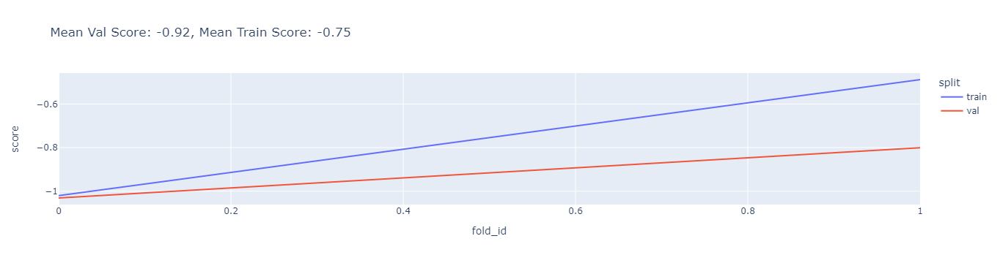

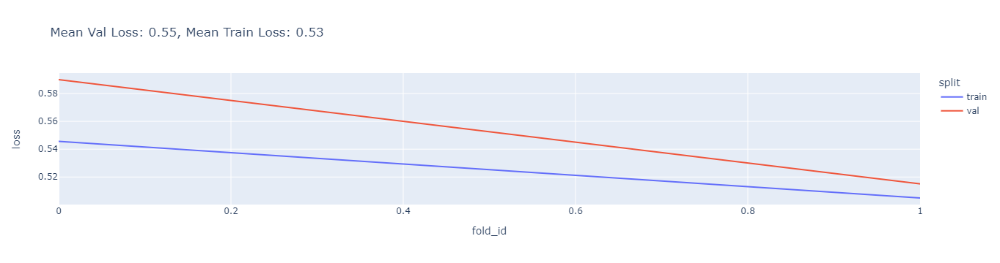

3 fold:


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/3 [00:00<?, ?it/s]

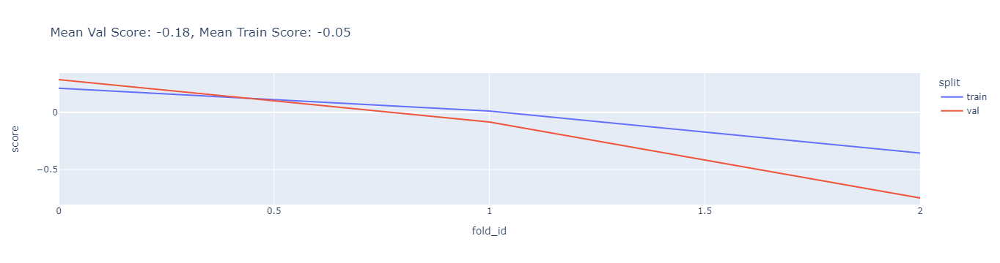

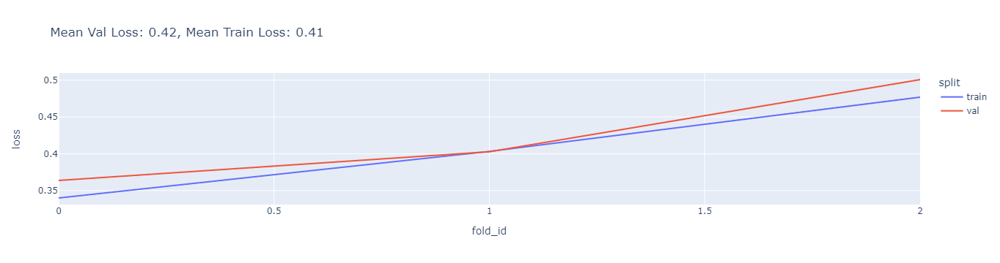

4 fold:


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/4 [00:00<?, ?it/s]

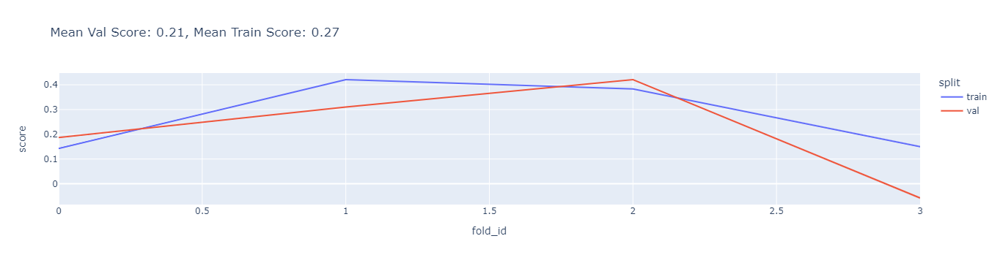

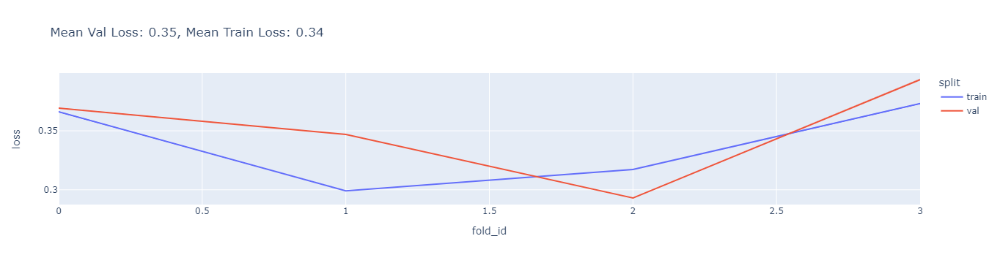

5 fold:


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/5 [00:00<?, ?it/s]

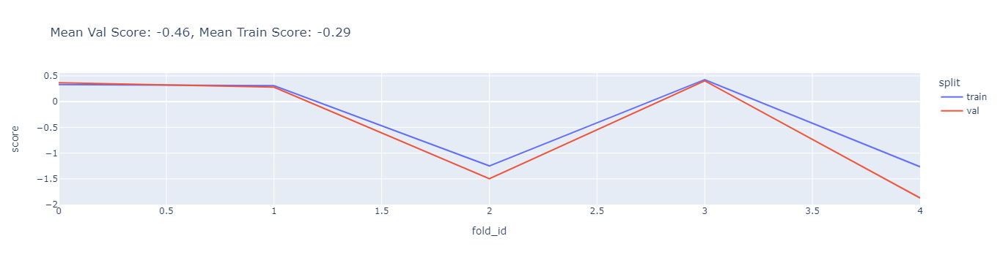

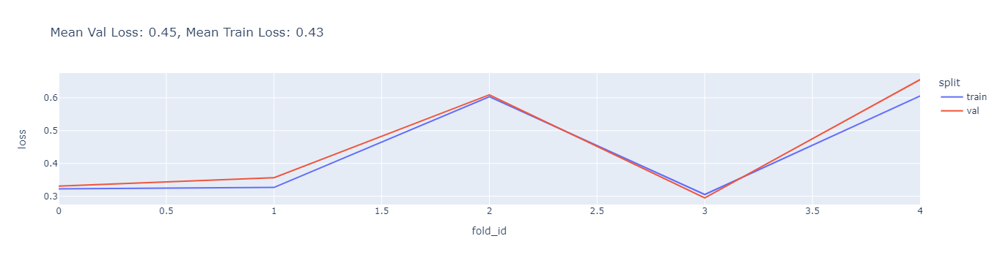

6 fold:


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/6 [00:00<?, ?it/s]

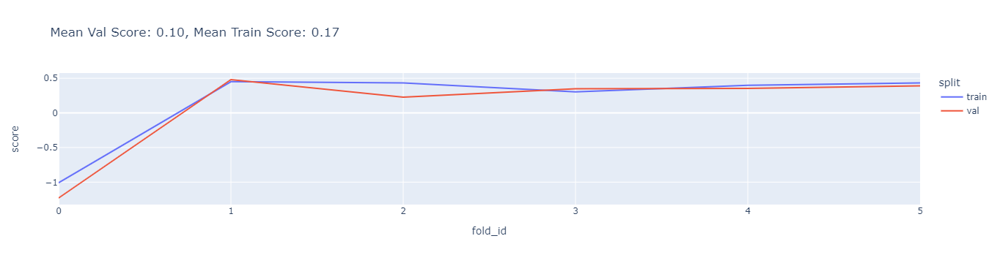

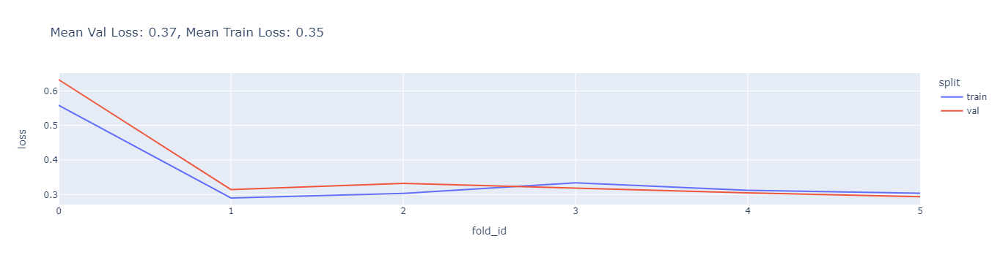

7 fold:


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/7 [00:00<?, ?it/s]

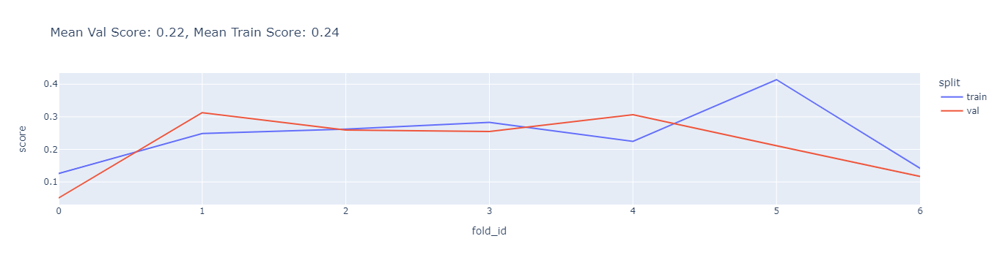

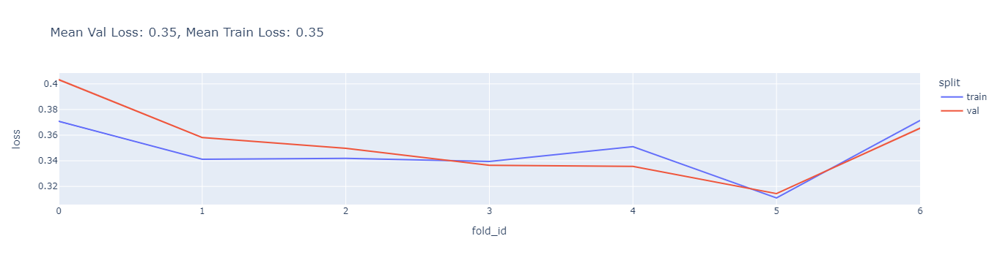

8 fold:


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/8 [00:00<?, ?it/s]

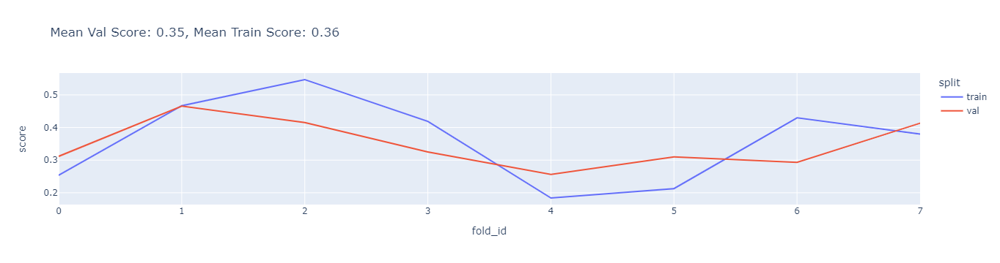

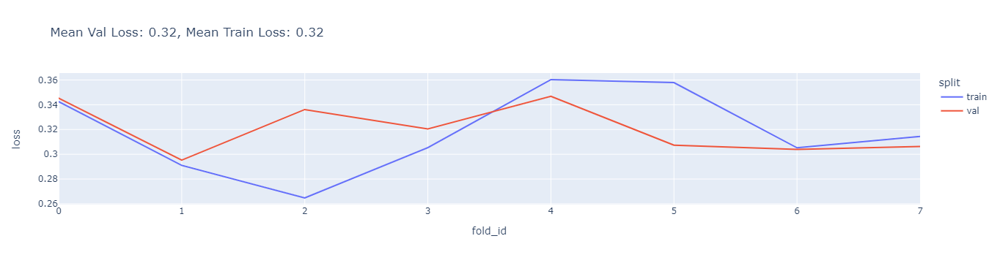

9 fold:


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/9 [00:00<?, ?it/s]

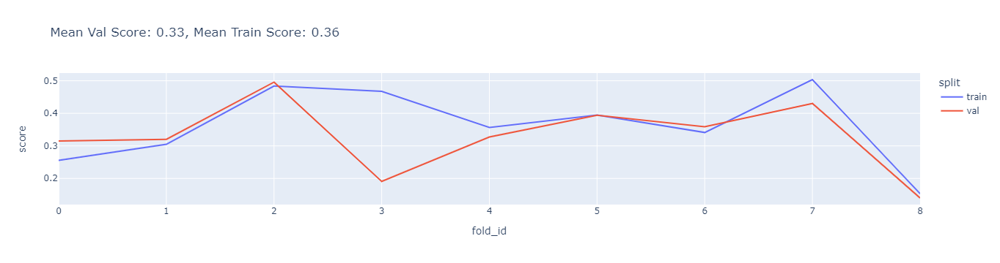

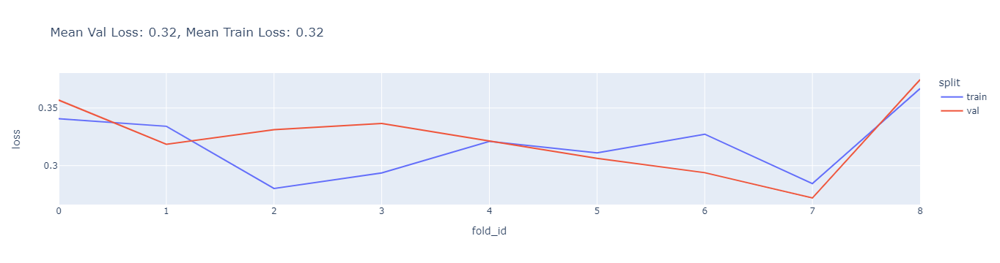

In [42]:
if show_visuals:
    for _k in range(2, 10):
        print(f"{_k} fold:")
        get_cv_score_and_loss(X_selected, np.log(t), found_model, k=_k, show_score_loss_graphs=True, use_pbar=True )

### Testing LeavePOut for some P = 1 (Leave One Out):

Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/1460 [00:00<?, ?it/s]

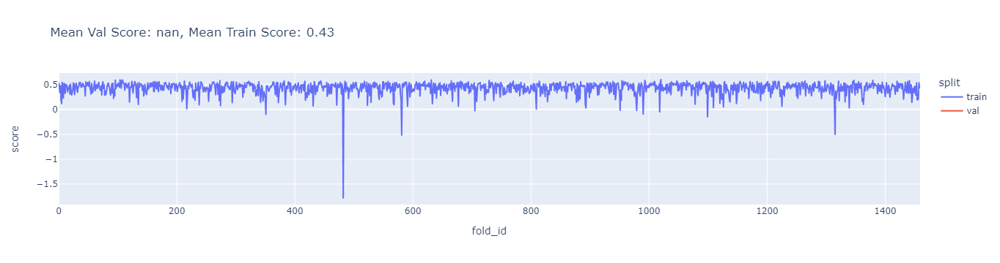

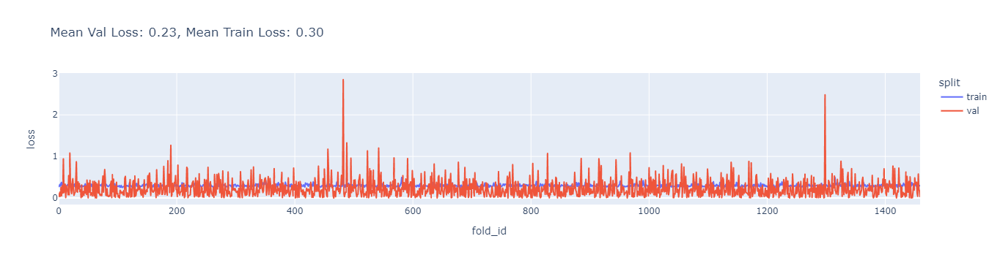

In [43]:
# This outputs a long stacktrace and the result is not good, we prefer just using the defaults
if show_visuals:
    get_cv_score_and_loss(X_selected, np.log(t), found_model, p=1, show_score_loss_graphs=True, use_pbar=True)

Looks like there's not much reason to redo our model :)

---

# Exercise 4
The main problems I had last time were that I need to address now:
1. Using MSE instead of RMSE
2. Poor handling of data (the main reason I found for the high loss runs was that I didn't transform the target with log()).

I already addressed (1) in the get_cv_score_and_loss function, and will use ```"neg_root_mean_squared_error"``` when gridsearching. I will address (2) now by starting over the preprocessing stage from scratch.

In [15]:
# more imports for ex4
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, VotingRegressor, StackingRegressor
from sklearn import svm
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor

# Preprocessing

In [16]:
train = pd.read_csv(train_path)
test  = pd.read_csv(test_path)

train = train.drop(columns="Id")
test  = test.drop(columns="Id")

# remove columns with too many missing values
train = train.drop(columns=['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu'])
test  = test.drop(columns=['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu'])

numeric_features = [feature for feature in train.columns if train[feature].dtypes != "object" and feature != "SalePrice"]
categorical_features = [feature for feature in train.columns if train[feature].dtypes == "object"]

# handle numerical missing values
def replace_with_median(df):
    nans=df.isna().sum()
    nans=nans[nans>0]
    for feature in nans.index:
        df.loc[df[feature].isna(),feature]=df.loc[~df[feature].isna(),feature].sort_values().values[int(df.shape[0]/2)]

replace_with_median(train)
replace_with_median(test)

# normalize the numerical data
scaler = StandardScaler()
train[numeric_features] = scaler.fit_transform(train[numeric_features])
test[numeric_features]  = scaler.transform(test[numeric_features])

# handle categorical values by MANUALLY onehot encoding them to EASILY ensure sync between train and test.
for feature in categorical_features:    
    for num, value in enumerate(np.unique((list(train[feature].unique()) + list(test[feature].unique())))):          
        train[f"{feature}_{num}"] = pd.Series(train[feature] == value, dtype="int")        
        test[f"{feature}_{num}"]  = pd.Series(test[feature] == value, dtype="int")
    train = train.drop(columns=feature)
    test  = test.drop(columns=feature)

train['SalePrice'] = np.log(train['SalePrice']) # the most crucial fix for me :)

t = train['SalePrice'].copy()
X = train.drop(['SalePrice'], axis=1)
X

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_5,SaleType_6,SaleType_7,SaleType_8,SaleCondition_0,SaleCondition_1,SaleCondition_2,SaleCondition_3,SaleCondition_4,SaleCondition_5
0,0.073375,-0.260588,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1,-0.872563,0.419126,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,0,0,0,1,0,0,0,0,1,0
2,0.073375,-0.124645,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0,0,0,1,0,0,0,0,1,0
3,0.309859,-0.487159,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0,0,0,1,1,0,0,0,0,0
4,0.073375,0.600382,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.073375,-0.396530,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1456,-0.872563,0.645697,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,0,0,0,1,0,0,0,0,1,0
1457,0.309859,-0.215274,-0.147810,0.651479,3.078570,-1.002492,1.024029,-0.570750,-0.369871,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1458,-0.872563,-0.124645,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,0,0,0,1,0,0,0,0,1,0


# PCA
Since we have way too many features, we will perform PCA.

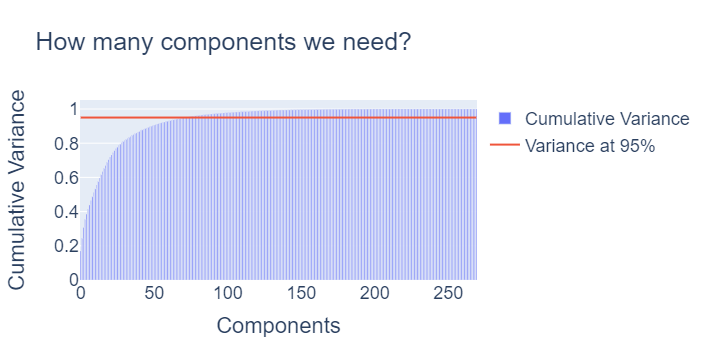

With n_components=71 we have the 95.0% of the data variance, so we will choose this value.


In [17]:
# choose number of components that explains the data variance with a wanted ratio
def get_and_show_best_n_components(x, train_df, wanted_var_ratio):
    pca = PCA(n_components=train_df.shape[1]-1)
    trans_x = pca.fit_transform(x)
    fig=go.Figure()
    fig.add_traces(go.Bar(x=np.arange(train_df.shape[1]-1),y=np.cumsum(pca.explained_variance_ratio_),name="Cumulative Variance"))  
    n_comp=np.where(np.cumsum(pca.explained_variance_ratio_)>wanted_var_ratio)[0][0]
    fig.add_traces(go.Scatter(x=np.arange(train_df.shape[1]-1),y=[wanted_var_ratio]*(train_df.shape[1]-1),name="Variance at 95%"))
    fig.update_layout(title="How many components we need?",xaxis_title="Components",yaxis_title="Cumulative Variance", font=dict(
            family="Arial",
            size=18,
        ))
    fig.show()
    print(f"With n_components={n_comp} we have the {wanted_var_ratio*100}% of the data variance, so we will choose this value.")
    return n_comp

best_n_comp = get_and_show_best_n_components(X, train, 0.95)
pca = PCA(n_components=best_n_comp)
X_pca = pca.fit_transform(X)
test_pca = pca.transform(test)

# Choosing model

choosing with hyper paramter search + comparing PCA to non-PCA Xs

In [18]:
def make_rmse():
    return make_scorer(mean_squared_error, greater_is_better=False, squared=False)

def cross_validate(_X, _y, model, cv=5):
    print(f'CV of {cv} KFolds.')
    cvs = cross_val_score(model, _X, _y, cv=cv, scoring=make_rmse())
    rmse = abs(np.mean(cvs))
    print(f'RMSE Mean: {rmse}')
    return rmse

kfold = KFold(n_splits=5, shuffle=True, random_state=1)
models = []

### KNN


In [19]:
knn = KNeighborsRegressor()

knn_params = {
    'n_neighbors': list(range(2, 15)),
    'weights': ['uniform','distance'],
    'p': list(range(1, 7))
}

gsKNN = GridSearchCV(knn, param_grid=knn_params, cv=kfold, scoring="neg_root_mean_squared_error", n_jobs=-1, verbose=1)

gsKNN.fit(X, t)

knn_best1 = gsKNN.best_estimator_
print(f"best KNN RMSE : {-gsKNN.best_score_} with {knn_best1}")
knn_best1_score = -gsKNN.best_score_

gsKNN.fit(X_pca, t)

knn_best2 = gsKNN.best_estimator_
print(f"best KNN RMSE (pca): {-gsKNN.best_score_} with {knn_best2}")
use_non_pca = knn_best1_score < -gsKNN.best_score_
knn_best = knn_best1 if use_non_pca else knn_best2
models.append((knn_best, X if use_non_pca else X_pca, min(knn_best1_score, -gsKNN.best_score_)))

Fitting 5 folds for each of 156 candidates, totalling 780 fits
best KNN RMSE : 0.16197665243823017 with KNeighborsRegressor(n_neighbors=6, p=1, weights='distance')
Fitting 5 folds for each of 156 candidates, totalling 780 fits
best KNN RMSE (pca): 0.16660795820958235 with KNeighborsRegressor(n_neighbors=7, weights='distance')


### SVM

In [20]:
lsvr = svm.LinearSVR(random_state=1)

lsvr_params = {
    'C': [0.5, 1.0, 5.0, 10.0],
    'tol': [0.01, 0.001, 0.0001, 0.00001],
    'loss': ['epsilon_insensitive', 'squared_epsilon_insensitive'],
    'fit_intercept': [True, False],
    'dual': [True, False]
}

gsLSVR = GridSearchCV(lsvr, param_grid=lsvr_params, cv=kfold, scoring="neg_root_mean_squared_error", n_jobs=-1, verbose=1)

gsLSVR.fit(X, t)

lsvr_best1 = gsLSVR.best_estimator_
print(f"best SVM RMSE: {-gsLSVR.best_score_} with {lsvr_best1}")
lsvr_best1_score = -gsLSVR.best_score_

gsLSVR.fit(X_pca, t)

lsvr_best2 = gsLSVR.best_estimator_
print(f"best SVM RMSE (pca): {-gsLSVR.best_score_} with {lsvr_best2}")
use_non_pca = lsvr_best1_score < -gsLSVR.best_score_
lsvr_best = lsvr_best1 if use_non_pca else lsvr_best2
models.append((lsvr_best, X if use_non_pca else X_pca, min(lsvr_best1_score, -gsLSVR.best_score_)))

Fitting 5 folds for each of 128 candidates, totalling 640 fits
best SVM RMSE: 0.14834419609884847 with LinearSVR(loss='squared_epsilon_insensitive', random_state=1, tol=0.01)
Fitting 5 folds for each of 128 candidates, totalling 640 fits
best SVM RMSE (pca): 0.1453025219723273 with LinearSVR(C=5.0, loss='squared_epsilon_insensitive', random_state=1, tol=0.01)


### Ensembles

### Random forest (Ensemble of decision trees)

In [21]:
rf = RandomForestRegressor(random_state=1)

rf_params = {
    'n_estimators': [50, 75, 100],
    'max_depth': [10, 15, 20],
    'min_samples_split': [2, 4, 6, 8],
    'min_samples_leaf': [1, 2, 3, 4],
}

gsRF = GridSearchCV(rf, param_grid=rf_params, cv=kfold, scoring="neg_root_mean_squared_error", n_jobs=-1, verbose=1)

gsRF.fit(X, t)

rf_best1 = gsRF.best_estimator_
print(f"best random forest RMSE: {-gsRF.best_score_} with {rf_best1}")
rf_best1_score = -gsRF.best_score_

gsRF.fit(X_pca, t)

rf_best2 = gsRF.best_estimator_
print(f"best random forest RMSE (pca): {-gsRF.best_score_} with {rf_best2}")
use_non_pca = rf_best1_score < -gsRF.best_score_
rf_best = rf_best1 if use_non_pca else rf_best2
models.append((rf_best, X if use_non_pca else X_pca, min(rf_best1_score, -gsRF.best_score_)))

Fitting 5 folds for each of 144 candidates, totalling 720 fits
best random forest RMSE: 0.14285406995522917 with RandomForestRegressor(max_depth=15, min_samples_split=8, n_estimators=75,
                      random_state=1)
Fitting 5 folds for each of 144 candidates, totalling 720 fits
best random forest RMSE (pca): 0.14288128795047142 with RandomForestRegressor(max_depth=20, min_samples_split=4, random_state=1)


In [22]:
estimators = [("knn", knn_best), ("lsvr", lsvr_best), ("rf", rf_best)]

### Voting Regressor Ensemble

In [23]:
vr = VotingRegressor(estimators=estimators, n_jobs=-1)

vr_params = {
    'weights': [
                (1,1,1), (1,1,2), (1,2,1), (2,1,1), (1,2,3),
                (1,3,2), (3,2,1), (3,1,2), (2,3,1), (2,1,3)
               ]
}

gsVR = GridSearchCV(vr, param_grid=vr_params, cv=kfold, scoring="neg_root_mean_squared_error", n_jobs=-1, verbose=1)

gsVR.fit(X, t)

vr_best1 = gsVR.best_estimator_
print(f"best voting regressor RMSE: {-gsVR.best_score_} with {vr_best1}")
vr_best1_score = -gsVR.best_score_

gsVR.fit(X_pca, t)

vr_best2 = gsVR.best_estimator_
print(f"best voting regressor RMSE (pca): {-gsVR.best_score_} with {vr_best2}")
use_non_pca = vr_best1_score < -gsVR.best_score_
vr_best = vr_best1 if use_non_pca else vr_best2
models.append((vr_best, X if use_non_pca else X_pca, min(vr_best1_score, -gsVR.best_score_)))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best voting regressor RMSE: 0.12903331860368855 with VotingRegressor(estimators=[('knn',
                             KNeighborsRegressor(n_neighbors=6, p=1,
                                                 weights='distance')),
                            ('lsvr',
                             LinearSVR(C=5.0,
                                       loss='squared_epsilon_insensitive',
                                       random_state=1, tol=0.01)),
                            ('rf',
                             RandomForestRegressor(max_depth=15,
                                                   min_samples_split=8,
                                                   n_estimators=75,
                                                   random_state=1))],
                n_jobs=-1, weights=(1, 2, 3))
Fitting 5 folds for each of 10 candidates, totalling 50 fits
best voting regressor RMSE (pca): 0.13420133575996968 with VotingReg

### Stacking Regressor Ensemble

In [24]:
sr = StackingRegressor(estimators=estimators[:-1], final_estimator=estimators[-1][1])

print("stacking regressor RMSE")
sr.fit(X, t)
sr_score_1 = cross_validate(X, t, sr)

print("stacking regressor RMSE with pca:")
sr.fit(X_pca, t)
sr_score_2 = cross_validate(X_pca, t, sr)

models.append((sr, X if sr_score_1 < sr_score_2 else X_pca, min(sr_score_1, sr_score_2)))

stacking regressor RMSE
CV of 5 KFolds.
RMSE Mean: 0.1427253369216384
stacking regressor RMSE with pca:
CV of 5 KFolds.
RMSE Mean: 0.13857126184542579


We can see that PCA gave better results only with ```SVM``` and ```StackingRegressor```.

# Submission

Finally, we can choose the model and use it.

#### best model:

In [25]:
best_model_and_df = min(models, key=lambda t: t[2]) # choose the model
best_model, best_x_df, score = best_model_and_df
print(f"model = {best_model}\n score = {score}")

model = VotingRegressor(estimators=[('knn',
                             KNeighborsRegressor(n_neighbors=6, p=1,
                                                 weights='distance')),
                            ('lsvr',
                             LinearSVR(C=5.0,
                                       loss='squared_epsilon_insensitive',
                                       random_state=1, tol=0.01)),
                            ('rf',
                             RandomForestRegressor(max_depth=15,
                                                   min_samples_split=8,
                                                   n_estimators=75,
                                                   random_state=1))],
                n_jobs=-1, weights=(1, 2, 3))
 score = 0.12903331860368855


Did we end up using the PCA x df?

In [44]:
best_x_df_rows, best_x_df_cols = best_x_df.shape
X_pca_rows, X_pca_cols = X_pca.shape
used_pca = best_x_df_cols == X_pca_cols
print("used PCA:", used_pca)

used PCA: False


In [31]:
best_x_df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_5,SaleType_6,SaleType_7,SaleType_8,SaleCondition_0,SaleCondition_1,SaleCondition_2,SaleCondition_3,SaleCondition_4,SaleCondition_5
0,0.073375,-0.260588,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1,-0.872563,0.419126,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,0,0,0,1,0,0,0,0,1,0
2,0.073375,-0.124645,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0,0,0,1,0,0,0,0,1,0
3,0.309859,-0.487159,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0,0,0,1,1,0,0,0,0,0
4,0.073375,0.600382,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,0,0,0,1,0,0,0,0,1,0


In [28]:
classifer = best_model.fit(best_x_df, t)
prediction = classifer.predict(test_pca if used_pca else test)
prediction = np.exp(prediction) # exponentiate back since we transformed the target with log

In [30]:
result = pd.DataFrame()
result['Id'] = test_ids
result['SalePrice'] = prediction
result.to_csv('submission.csv', index = False)
result.head()

,Id,SalePrice
0,1461,123619.006056
1,1462,156540.401652
2,1463,179541.821733
3,1464,189954.421455
4,1465,191163.209670


# Kaggle Results

![leaderboard](https://i.imgur.com/GLpw9kc.png)

![runs](https://i.imgur.com/JLfByXv.png)

# Thoughts and summary
- I have massively improved my score and got a great leaderboard placement just by fixing the issues that were raised for me for exercise 2 :)
- This was the slowest exercise to submit so far, by far. I ran the notebook simultaneously both on my computer on a Jupyter Lab instance to get csv files and also directly on Kaggle and it still took a ton of time until I finished all 10 daily submissions.
- I didn't bother checking LWLR since sklearn doesn't include it and judging by the KNN results manually importing it from a third party github repo isn't worth it.

# Sources Used:
- https://stackoverflow.com/
- https://scikit-learn.org/stable/user_guide.html
- https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.StackingRegressor.html
- Top ranking notebooks to understand how to do validation and prediction with PCA transformed dfs + easy synced OneHot encoding.
- Lab Notebooks 7-9